**Outline of this lab**
- Simulate a noisy version of the music using the noises at various SNR Level

- Implement the spectral substraction method for denoising (search on my website about spectral substraction)

- Denoise the different given noisy version of the clean signal

- Discuss the parameters

# Preparation

In [1]:
import numpy as np
import numpy.fft as nf
import scipy.signal as signal
import matplotlib.pyplot as plt
import wave
import cv2
import simpleaudio as sa
import time
import IPython


In [2]:
## function wave_read: read the wave file and the corresponding parameters

def wave_read(file_name):
    file = wave.open(file_name)
    params = file.getparams() # read the parameters
    nchannels, sampwidth, framerate, nframes = params[:4]
    
    # Reads the complete frame data into str_data, which is a string type
    str_data = file.readframes(nframes)
    # Convert the audio waveform data to an array
    wave_data =  np.frombuffer(str_data, dtype = np.short)
    
    # time is an array paired with wave_data
    time = np.arange(0,nframes) * (1.0/ framerate)
    
    return nchannels, sampwidth, framerate, nframes, wave_data, time


In [3]:
# read three noises file
nchannels_1, sampwidth_1, framerate_1, nframes_1, noise_data_1, time_1 = wave_read("noise1.wav")
nchannels_2, sampwidth_2, framerate_2, nframes_2, noise_data_2, time_2 = wave_read("noise2.wav")
nchannels_3, sampwidth_3, framerate_3, nframes_3, noise_data_3, time_3 = wave_read("noise3.wav")


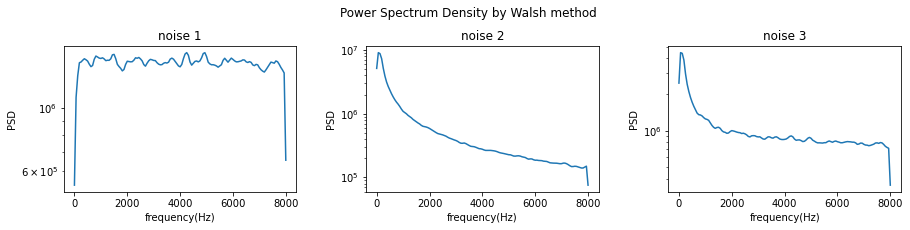

In [4]:
# PSD of three noises
f_wel1, Pxx_wel1 = signal.welch(noise_data_1, framerate_1, 'flattop', scaling='spectrum')
f_wel2, Pxx_wel2 = signal.welch(noise_data_2, framerate_2, 'flattop', scaling='spectrum')
f_wel3, Pxx_wel3 = signal.welch(noise_data_3, framerate_3, 'flattop', scaling='spectrum')

# plot the spectrum density of all the three noises
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize = (15,3))

ax1.semilogy(f_wel1, Pxx_wel1)
ax1.set_title("noise 1")
ax1.set_xlabel('frequency(Hz)')
ax1.set_ylabel('PSD')

ax2.semilogy(f_wel2, Pxx_wel2)
ax2.set_title("noise 2")
ax2.set_xlabel("frequency(Hz)")
ax2.set_ylabel('PSD')

ax3.semilogy(f_wel3, Pxx_wel3)
ax3.set_title("noise 3")
ax3.set_xlabel("frequency(Hz)")
ax3.set_ylabel('PSD')

plt.suptitle('Power Spectrum Density by Walsh method')

plt.subplots_adjust(left=0.125,
                    bottom=0.125, 
                    right=0.9, 
                    top=0.8, 
                    wspace=0.3, 
                    hspace=0.1)

plt.show()

In [5]:
# read the music file
nchannels_music, sampwidth_music, framerate_music, nframes_music, music_data, time_music\
= wave_read("music.wav")


In [6]:
# normalization

music_data = music_data.astype(np.double)/ 2**15
noise_data_1 = noise_data_1.astype(np.double)/ 2**15
noise_data_2 = noise_data_2.astype(np.double)/ 2**15
noise_data_3 = noise_data_3.astype(np.double)/ 2**15



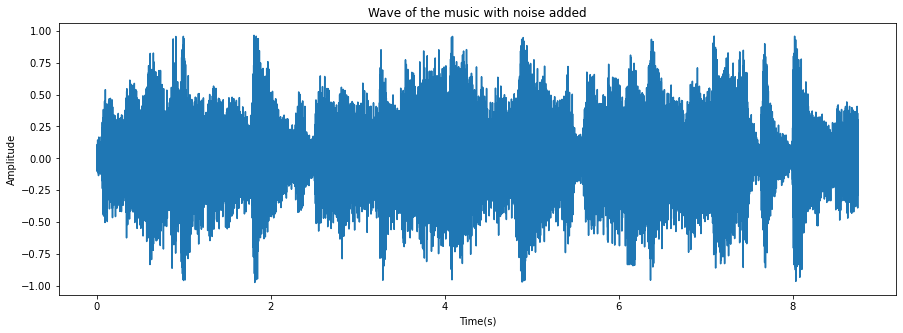

In [7]:
plt.figure(figsize = (15,5))
plt.plot(time_music, music_data)
plt.xlabel("Time(s)")
plt.ylabel("Amplitude") 
plt.title("Wave of the music with noise added")
plt.show()


# Simulate a noisy version of the music using noises at various SNR Level

In [8]:
def add_noise(music, noise, SNRdb):
    # calculate the power of noise from SNRdb
    Ps = np.mean(np.power(music, 2))
    Pn = Ps / (pow(10, SNRdb/10)) 
        
    noise = noise* np.sqrt(Pn)
    
    # add the noise to initial music
    music_with_noise = music + noise 
    
    return music_with_noise


In [9]:
SNRdb_list = [0, 5, 10, 15, 20]

musics_with_white_noise = []
musics_with_pink_noise = []

# add the noise 1 and noise 2 respectively to the music
for SNRdb in SNRdb_list:
    musics_with_white_noise.append(add_noise(music_data, noise_data_1, SNRdb))
    musics_with_pink_noise.append(add_noise(music_data, noise_data_2, SNRdb))
    

In [10]:
# results of music with white noise_1 added
print("Add the white noise")
for i in range(len(SNRdb_list)):
    IPython.display.display(IPython.display.Audio(musics_with_white_noise[i], rate = framerate_music))
    

Add the white noise


In [11]:
# results of music with noise2 added
print("Add the pink noise")
for i in range(len(SNRdb_list)):
    IPython.display.display(IPython.display.Audio(musics_with_pink_noise[i], rate = framerate_music))
    

Add the pink noise


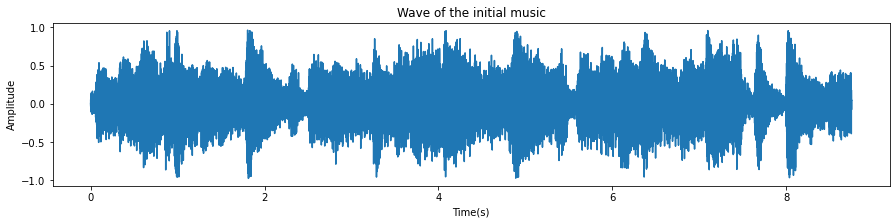

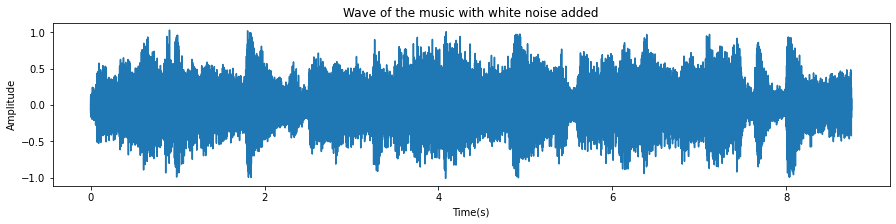

In [12]:
plt.figure(figsize = (15,3))
plt.plot(time_music, music_data)
plt.xlabel("Time(s)")
plt.ylabel("Amplitude") 
plt.title("Wave of the initial music")
plt.show()

plt.figure(figsize = (15,3))
plt.plot(time_music, musics_with_white_noise[0])
plt.xlabel("Time(s)")
plt.ylabel("Amplitude") 
plt.title("Wave of the music with white noise added")
plt.show()


# Implement the spectral substraction method for denoising

## Hard thresholding

Firstly, I implemented the hard throsholding:
$$
X(\tau, \nu)= \begin{cases}Y(\tau, \nu) & \text { if }|Y(\tau, \nu)|>\lambda\left|S_{n}(\nu)\right| \\ 0 & \text { if }|Y(\tau, \nu)| \leq \lambda\left|S_{n}(\nu)\right|\end{cases}
$$

In [13]:
def hard_thresholding(lamb, noise, sound_with_noise, framerate):
    # calculate the PDS of noise - Sn(v)
    f_wel, Pxx_wel = signal.welch(noise, fs = framerate)

    # calculate the STFT of sound with noise
    f_stft, t_stft, Y_stft = signal.stft(sound_with_noise, fs = framerate)
    
    # abs of Y and Sn
    abs_Y = np.abs(Y_stft)
    abs_Sn = np.abs(Pxx_wel)
    
    # calculate the denoised sound X_stft by spectral substrction
    X_stft = np.zeros(np.shape(Y_stft), dtype = complex)
    abs_Sn = np.tile(abs_Sn, (Y_stft.shape[1],1)).T
    X_stft = np.where(abs_Y > lamb * abs_Sn, Y_stft, X_stft)
    
    # do inverse STFT
    _, denoised_music = signal.istft(X_stft,fs = framerate)
    
    return denoised_music

## Spectral substraction

In the second part, I implemented the spectral substraction in the following form:
$$
X(\tau, \nu)=Y(\tau, \nu)\left(1-\frac{\lambda^{2}\left|S_{n}(\nu)\right|^{2}}{|Y(\tau, \nu)|^{2}}\right)^{+}
$$
where $(x)^{+}=\max (x, 0)$

In [14]:
def spectral_substraction(lamb, noise, sound_with_noise, framerate):
    # calculate the PDS of noise - Sn(v)
    f_wel, Pxx_wel = signal.welch(noise, fs = framerate)

    # calculate the STFT of sound with noise
    f_stft, t_stft, Y_stft = signal.stft(sound_with_noise, fs = framerate)
    
    # abs of Y and Sn
    abs_Y = np.abs(Y_stft)
    abs_Sn = np.abs(Pxx_wel)

    # calculate the denoised sound X_stft by spectral substrction
    
    abs_Sn = np.tile(abs_Sn, (Y_stft.shape[1],1)).T
    mask = np.ones((Y_stft.shape))
    mask = np.maximum(mask - np.power(lamb,2)* np.power(abs_Sn, 2) / np.power(abs_Y, 2), 0)
    X_stft = Y_stft * mask

    # do inverse STFT
    _, denoised_music = signal.istft(X_stft,fs = framerate) # np.real(signal.istft(X_stft,fs = framerate))
    
    return denoised_music


## General Spectral substraction

Then, a general form of spectral substraction is implemented:

$$
X(\tau, \nu)= \begin{cases}Y(\tau, \nu)\left(1-\frac{\lambda^{\alpha}\left|S_{n}(\nu)\right|^{\alpha}}{|Y(\tau, \nu)|^{\alpha}}\right)^{\beta} & \text { if }|Y(\tau, \nu)|^{\alpha}>\lambda^{\alpha}\left|S_{n}(\nu)\right|^{\alpha} \\ \gamma \frac{Y(\tau, \nu)}{|Y(\tau, \nu)|}\left|S_{n}(\nu)\right| & \text { if }|Y(\tau, \nu)|^{\alpha} \leq \lambda^{\alpha}\left|S_{n}(\nu)\right|^{\alpha}\end{cases}
$$
where $\lambda, \alpha, \beta, \gamma>0$, are some parameters. Usually, we chose $\alpha=1$ or $2, \beta=\frac{1}{2}$ or 1 and $\gamma « 1$.


In [15]:
def general_spectral_substraction(lamb, alpha, beta, gamma, noise, sound_with_noise, framerate):
    # calculate the PDS of sound - Sn(v)
    f_wel, Pxx_wel = signal.welch(noise, fs = framerate)

    # calculate the STFT of sound with noise
    f_stft, t_stft, Y_stft = signal.stft(sound_with_noise, fs = framerate)

    # abs of Y and Sn
    abs_Y = np.abs(Y_stft)
    abs_Sn = np.abs(Pxx_wel)
    
    # calculate the denoised sound X_stft by spectral substrction
    
    abs_Sn = np.tile(abs_Sn, (Y_stft.shape[1],1)).T
    mask = np.ones((Y_stft.shape))
    mask = np.maximum(mask - np.power(lamb,2)* np.power(abs_Sn, 2) / np.power(abs_Y, 2), 0)
    
    X_stft_1 = Y_stft * mask
    X_stft_2 = gamma * Y_stft * (abs_Sn/abs_Y)
    
    X_stft = np.where(pow(abs_Y, alpha)> pow(lamb, alpha) * pow(abs_Sn, alpha), X_stft_1, X_stft_2)
    
    # do inverse STFT
    _, denoised_music = signal.istft(X_stft, fs = framerate)
    
    return denoised_music
    

# Results and Discussion

To discuss the effect of our denoising implementation, I re-calculate the SNR level from the denoised music obtained, which help evaluate the impact of parameters, especially the choose of $\lambda$, on the output SNR.

In [16]:
# calculate the new SNR
def calculate_snr(denoised_music, music):
    if len(denoised_music) < len(music):
        music = music[0: len(denoised_music)]
        length = len(denoised_music)
    elif len(denoised_music) > len(music):
        denoised_music = denoised_music[0:len(music)]
        length = len(music)
       
    P_music = np.mean(np.power(music, 2))
    P_noise = np.mean(np.power((music - denoised_music), 2))

    SNRdb = 10 * np.log10(P_music / P_noise)

    return SNRdb

## comparaison of three implementations

In this section, I want to compare the effect of three implementations above with the same lambda choosen. And we can notice that there is no big difference between these three implementations. So in the following test, I used the general one. 

What's more, we can draw a preliminary conclusion that the effect of spectral substraction denoising is not bad. 

In [17]:
lamb = 7000
alpha = 2
beta = 0.5
gamma = 1e-5

denoised_music_1 = hard_thresholding(lamb, noise_data_1, musics_with_white_noise[0], framerate_music)
denoised_music_2 = spectral_substraction(lamb, noise_data_1, musics_with_white_noise[0], framerate_music)
denoised_music_3 = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_1, musics_with_white_noise[0], framerate_music)

print("Audio of music with white noise")
IPython.display.display(IPython.display.Audio(musics_with_white_noise[0], rate = framerate_music))
print("Audio of music after hard threshold denoising")
IPython.display.display(IPython.display.Audio(denoised_music_1, rate = framerate_music))
print("Audio of music after hard spectral substraction denoising")
IPython.display.display(IPython.display.Audio(denoised_music_2, rate = framerate_music))
print("Audio of music after hard general spectral substraction denoising")
IPython.display.display(IPython.display.Audio(denoised_music_3, rate = framerate_music))

Audio of music with white noise


Audio of music after hard threshold denoising


Audio of music after hard spectral substraction denoising


Audio of music after hard general spectral substraction denoising


## choose of parameters $\lambda$ and different level of SNR

In this part, I firstly focus on the influence of choosing different $\lambda$ on the effect of denoising. 

Here, take the 0dB white noise as an emample. It's easy to notice that if $\lambda$ is too small, we couldn't totally denoise, however too large $\lambda$ will cause the distortion of the music. 

In [18]:
# Test of different parameters lambda
lambdas = [1, 10, 100, 500, 1000, 2000, 3000, 5000, 7000, 10000]

for lamb in lambdas:
    denoised_music = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_1, musics_with_white_noise[0], framerate_music)
    snr = calculate_snr(denoised_music, music_data)
    print("lambda =", lamb, ", the output SNR is", round(snr,2), "dB.")
    IPython.display.display(IPython.display.Audio(denoised_music, rate = framerate_music))


lambda = 1 , the output SNR is 13.37 dB.


lambda = 10 , the output SNR is 13.37 dB.


lambda = 100 , the output SNR is 13.52 dB.


lambda = 500 , the output SNR is 16.06 dB.


lambda = 1000 , the output SNR is 17.94 dB.


lambda = 2000 , the output SNR is 14.71 dB.


lambda = 3000 , the output SNR is 11.88 dB.


lambda = 5000 , the output SNR is 8.02 dB.


lambda = 7000 , the output SNR is 5.51 dB.


lambda = 10000 , the output SNR is 3.24 dB.


So to help choosing the right value of lambda, I plotted the curve of the output SNR with respect to the choose of $\lambda$ in the following. So we could choose the appropriate $\lambda$ according to its output SNR. For example for a input SNR of 0dB white noise, we would like to renforce the output SNR to about 3 to 5 dB, so we could choose a $\lambda$ between 6000 to 9000.

We can also see from this figure that for the peak of curve of white noise is about 18 dB, which means it's hard for us to denoise a noise higher than this threshod. What's more, comparing to the peak of the white noise, the peak of the pink noise is lower(about 13dB), which means spectral substraction method works better on white noise ranther than pink noise.


Text(0.5, 1.0, 'Curve SNR - lambda for white noise')

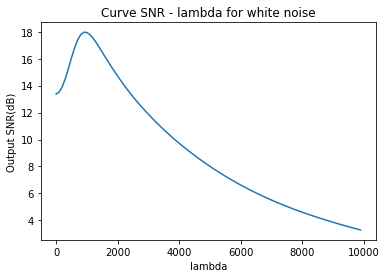

In [19]:
lambs =  np.arange(1,1e4, 100)
output_snr = []
for lamb in lambs:
    denoised_music = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_1, musics_with_white_noise[0], framerate_music)
    snr = calculate_snr(denoised_music, music_data)
    output_snr.append(snr)
    
plt.plot(lambs, output_snr)
plt.xlabel("lambda")
plt.ylabel("Output SNR(dB)") 
plt.title("Curve SNR - lambda for white noise")

Text(0.5, 1.0, 'Curve SNR - lambda for pink noise')

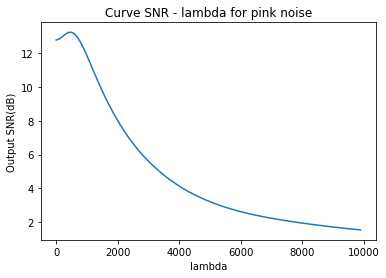

In [20]:
lambs =  np.arange(0,1e4, 100)
output_snr = []
for lamb in lambs:
    denoised_music = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_2, musics_with_pink_noise[0], framerate_music)
    snr = calculate_snr(denoised_music, music_data)
    output_snr.append(snr)
    
plt.plot(lambs, output_snr)
plt.xlabel("lambda")
plt.ylabel("Output SNR(dB)") 
plt.title("Curve SNR - lambda for pink noise")

## effect on different noise type

In this section, I'd like to explore if the spetral substraction denoising has always good effect on different type of noise.

In [21]:
lamb = 7000
alpha = 2
beta = 0.5
gamma = 1e-5
snr = 0

# for white noise
music_with_white_noise = add_noise(music_data, noise_data_1, snr)
denoised_white_noise = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_1, music_with_white_noise, framerate_music)
snr_1 = calculate_snr(denoised_white_noise, music_data)
print("The output SNR for white noise is", round(snr_1,2), "dB.")
IPython.display.display(IPython.display.Audio(denoised_white_noise, rate = framerate_music))

# for pink noise
music_with_pink_noise = add_noise(music_data, noise_data_2, snr)
denoised_pink_noise = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_2, music_with_pink_noise, framerate_music)
snr_2 = calculate_snr(denoised_pink_noise, music_data)
print("The output SNR for pink noise is", round(snr_2,2), "dB.")
IPython.display.display(IPython.display.Audio(denoised_pink_noise, rate = framerate_music))

# for a combination of pink noise and white noise
music_with_combination_noise = add_noise(music_data, noise_data_3, snr)
denoised_combinatiom_noise = general_spectral_substraction(lamb, alpha, beta, gamma, noise_data_3, music_with_combination_noise, framerate_music)
snr_3 = calculate_snr(denoised_combinatiom_noise, music_data)
print("The output SNR for a combination of white and pink noise is", round(snr_3,2), "dB.")
IPython.display.display(IPython.display.Audio(denoised_combinatiom_noise, rate = framerate_music))


The output SNR for white noise is 5.51 dB.


The output SNR for pink noise is 2.24 dB.


The output SNR for a combination of white and pink noise is 3.18 dB.
